# Settings

## Imports

In [1]:
!pip install --ignore-installed Pillow==9.0.0

     ---------------------------------------- 3.2/3.2 MB 3.3 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
object-detection 0.1 requires apache-beam, which is not installed.
object-detection 0.1 requires avro-python3, which is not installed.
object-detection 0.1 requires contextlib2, which is not installed.
object-detection 0.1 requires Cython, which is not installed.
object-detection 0.1 requires pycocotools, which is not installed.
tf-models-official 2.11.2 requires Cython, which is not installed.
tf-models-official 2.11.2 requires gin-config, which is not installed.
tf-models-official 2.11.2 requires google-api-python-client>=1.6.7, which is not installed.
tf-models-official 2.11.2 requires immutabledict, which is not installed.
tf-models-official 2.11.2 requires kaggle>=1.3.9, which is not installed.
tf-models-official 2.11.2 requires oauth2client, which is not installed.
tf-models-official 2.11.2 requires opencv-p

In [ ]:
!pip install beautifulsoup4
!pip install lxml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import datetime
import time
import random
import shutil
import sys
from enum import Enum, auto
from bs4 import BeautifulSoup
from numpy import asarray, arange, mgrid, ndarray
from PIL import Image, ImageDraw
#import lxml

In [ ]:
#sys.path.insert(0,'/content/drive/MyDrive/tf_workspace/Python_Code/custom_CNN.py')

In [ ]:
#from custom_CNN import Custom_CNN

## Support Functions

In [ ]:
# How to use the function:
#   augmented_images = [train_dataset[0][0][0] for i in range(5)]
#   plotImages(augmented_images)

def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
def loadImage(filename: str, imgSize:int = 64) -> ndarray:
    image = Image.open(filename)
    width, height = image.size
    image = image.resize(size=(imgSize, imgSize), resample=Image.NEAREST)
    np_data = np.array(image).astype('float32')/255
    #np_image = np.expand_dims(np_data, axis=0)
    return np_data, imgSize/width, imgSize/height#np_image

In [ ]:
def convolutional_block(x, filter):
    # copy tensor to variable called x_skip
    x_skip = x
    # Layer 1
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same', strides = (2,2))(x)
    x = tf.keras.layers.BatchNormalization(axis=3)(x)
    x = tf.keras.layers.Activation('relu')(x)
    # Layer 2
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = tf.keras.layers.BatchNormalization(axis=3)(x)
    # Processing Residue with conv(1,1)
    x_skip = tf.keras.layers.Conv2D(filter, (1,1), strides = (2,2))(x_skip)
    # Add Residue
    x = tf.keras.layers.Add()([x, x_skip])
    x = tf.keras.layers.Activation('relu')(x)
    return x
def identity_block(x, filter):
    # copy tensor to variable called x_skip
    x_skip = x
    # Layer 1
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = tf.keras.layers.BatchNormalization(axis=3)(x)
    x = tf.keras.layers.Activation('relu')(x)
    # Layer 2
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = tf.keras.layers.BatchNormalization(axis=3)(x)
    # Add Residue
    x = tf.keras.layers.Add()([x, x_skip])
    x = tf.keras.layers.Activation('relu')(x)
    return x
def ResNet34(shape = (32, 32, 3), classes = 10):
    # Step 1 (Setup Input Layer)
    x_input = tf.keras.layers.Input(shape)
    x = tf.keras.layers.ZeroPadding2D((3, 3))(x_input)
    # Step 2 (Initial Conv layer along with maxPool)
    x = tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')(x)
    # Define size of sub-blocks and initial filter size
    block_layers = [3, 4, 6, 3]
    filter_size = 64
    # Step 3 Add the Resnet Blocks
    for i in range(4):
        if i == 0:
            # For sub-block 1 Residual/Convolutional block not needed
            for j in range(block_layers[i]):
                x = identity_block(x, filter_size)
        else:
            # One Residual/Convolutional Block followed by Identity blocks
            # The filter size will go on increasing by a factor of 2
            filter_size = filter_size*2
            x = convolutional_block(x, filter_size)
            for j in range(block_layers[i] - 1):
                x = identity_block(x, filter_size)
    # Step 4 End Dense Network
    x = tf.keras.layers.AveragePooling2D((2,2), padding = 'same')(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(512, activation = 'relu')(x)
    x = tf.keras.layers.Dense(classes, activation = 'softmax')(x)
    model = tf.keras.models.Model(inputs = x_input, outputs = x, name = "ResNet34")
    return model

In [ ]:
def Custom_CNN(input_shape):
  #device_name = tf.test.gpu_device_name()
  #if device_name != '/device:GPU:0':
  #  print(
  #      '\n\nThis error most likely means that this notebook is not '
  #      'configured to use a GPU.  Change this in Notebook Settings via the '
  #      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  #  raise SystemError('GPU device not found')
  #tf.device('/device:GPU:0')
  model = tf.keras.models.Sequential([
      # Input layer
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),

      # Preprocessing
      #tf.keras.layers.RandomRotation(factor=1, fill_mode='reflect', interpolation='bilinear', seed=None, fill_value=0.0, ),
      #tf.keras.layers.RandomFlip(),

      # Feature extraction
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.GlobalAveragePooling2D(),

      # Classifier
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(1024, activation='relu'),
      tf.keras.layers.Dropout(0.5),
      tf.keras.layers.Dense(4, activation='softmax')
  ])
  return model

In [ ]:
def Custom_Small_CNN(input_shape):
  #device_name = tf.test.gpu_device_name()
  #if device_name != '/device:GPU:0':
  #  print(
  #      '\n\nThis error most likely means that this notebook is not '
  #      'configured to use a GPU.  Change this in Notebook Settings via the '
  #      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  #  raise SystemError('GPU device not found')
  #tf.device('/device:GPU:0')
  model = tf.keras.models.Sequential([
      # Input layer
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),

      # Preprocessing
      #tf.keras.layers.RandomRotation(factor=1, fill_mode='reflect', interpolation='bilinear', seed=None, fill_value=0.0, ),
      #tf.keras.layers.RandomFlip(),

      # Feature extraction
      tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      # Classifier
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(256, activation='relu'),
      tf.keras.layers.Dropout(0.5),
      tf.keras.layers.Dense(4, activation='softmax')
  ])
  return model

In [ ]:
def Custom_Small_CNN_v3(input_shape):
  #device_name = tf.test.gpu_device_name()
  #if device_name != '/device:GPU:0':
  #  print(
  #      '\n\nThis error most likely means that this notebook is not '
  #      'configured to use a GPU.  Change this in Notebook Settings via the '
  #      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  #  raise SystemError('GPU device not found')
  #tf.device('/device:GPU:0')
  model = tf.keras.models.Sequential([
      # Input layer
      tf.keras.layers.Conv2D(32, (7, 7), activation='relu', input_shape=input_shape),

      # Preprocessing
      #tf.keras.layers.RandomRotation(factor=1, fill_mode='reflect', interpolation='bilinear', seed=None, fill_value=0.0, ),
      #tf.keras.layers.RandomFlip(),

      # Feature extraction
      tf.keras.layers.Conv2D(32, (7, 7), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Conv2D(64, (7, 7), activation='relu'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      tf.keras.layers.Conv2D(64, (7, 7), activation='relu'),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.AveragePooling2D(pool_size=(2, 2)),

      # Classifier
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(256, activation='relu'),
      tf.keras.layers.Dropout(0.5),
      tf.keras.layers.Dense(4, activation='softmax')
  ])
  return model

In [ ]:
#model = tf.keras.applications.densenet.DenseNet201(include_top=False, input_shape=input_shape)

#baseModel = tf.keras.applications.densenet.DenseNet201(include_top=False, input_shape=input_shape)
#baseModel = tf.keras.applications.resnet.ResNet101(include_top=False, input_shape=input_shape)
#baseModel = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(include_top=False, input_shape=input_shape)
#baseModel = tf.keras.applications.nasnet.NASNetMobile(include_top=False, input_shape=input_shape)
def DenseNet_CNN(input_shape):
  baseModel = tf.keras.applications.densenet.DenseNet201(include_top=False, input_shape=input_shape)
  #baseModel = SeResNeXT(include_top=False, input_shape=input_shape)

  flat1 = tf.keras.layers.Flatten()(baseModel.layers[-1].output)
  class1 = tf.keras.layers.Dense(256, activation='relu')(flat1)
  output = tf.keras.layers.Dense(4, activation='softmax')(class1)

  model = tf.keras.Model(inputs = baseModel.inputs, outputs = output)
  return model

def NASNetMobile_CNN(input_shape):
  baseModel = tf.keras.applications.nasnet.NASNetMobile(include_top=False, input_shape=input_shape)
  #baseModel = SeResNeXT(include_top=False, input_shape=input_shape)

  flat1 = tf.keras.layers.Flatten()(baseModel.layers[-1].output)
  class1 = tf.keras.layers.Dense(256, activation='relu')(flat1)
  output = tf.keras.layers.Dense(4, activation='softmax')(class1)

  model = tf.keras.Model(inputs = baseModel.inputs, outputs = output)
  return model

In [ ]:
def getCnnShapes(shape)->tuple:
  #Do not Change!
  if(type(targetSizeElement) is int):
    target_shape = (targetSizeElement,targetSizeElement)
    input_shape = (targetSizeElement,targetSizeElement,3)
  elif(type(targetSizeElement) is tuple):
    if(len(targetSizeElement)== 2):
      target_shape = targetSizeElement
      input_shape = (*targetSizeElement, 3)
    else:
      raise("ImageSize tuple should have shape: (xLen, yLen)")
  else:
    raise("No valid imageSize specified")
  return target_shape, input_shape

## Settings

In [ ]:
#Location for training, validation, testing
training_img_dir = "/content/drive/MyDrive/tf_workspace/Images/Location_Images/bee3"
validation_img_dir = "/content/drive/MyDrive/tf_workspace/Images/Location_Images/test"
#testing_img_dir = "/content/drive/MyDrive/tf_workspace/training_cnn/images/testing"



#Model Training Settings
modelName="Custom_Detection_v3"
modelFolderName = "CNN/Localisation/"+modelName  #Location where the trained model should be stored (last part is the name of the folder)
batch_size = 32#64                             #Amount of images per batch
training_epochs=50                          #Training epochs
STEPS_BETWEEN_SAVES = 10
EARLY_STOP = True                          #Setting that allows the model to stop training earlier if it goes into overfitting.
CONTINUOUS_SAVE= True
targetSizeElement = 256                      #Image Size could be integer or tuple (if integer then ne number is for x and y)
maxImages = 1
target_shape, input_shape = getCnnShapes(targetSizeElement)

In [ ]:
print(input_shape)
class CNN_Models(Enum):
  #Custom = Custom_CNN(input_shape)
  Custom_small = Custom_Small_CNN_v3(input_shape)
  #ResNet = ResNet34(shape=input_shape, classes=4)
  #NASNetMobile = NASNetMobile_CNN(input_shape)

(256, 256, 3)


In [ ]:
#Used Model
used_model = CNN_Models.Custom_small

In [ ]:
#Select the model that should be used for training
model = used_model.value

print(model)
#model = ResNet34(shape=input_shape, classes=4)

#Initialize Project

## Initialize Keras Model Zoo

In [ ]:
#!pip install git+https://github.com/qubvel/classification_models.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/qubvel/classification_models.git to /tmp/pip-req-build-skwg_6e8
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/classification_models.git /tmp/pip-req-build-skwg_6e8
  Resolved https://github.com/qubvel/classification_models.git to commit a0f006e05485a34ccf871c421279864b0ccd220b
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.6 MB/s eta 0:00:00
  Created wheel for image-classifiers: filename=image_classifiers-1.0.0-py3-none-any.whl size=20048 sha256=871437af56f20dc09687d04ed656f604af09bef0a0017edd2f9902fceab072d3
  Stored in directory: /tmp/pip-ephem-wheel-cache-dubgkzl_/wheels/f5/13/cb/b1dbd79043c5a389742e422859b0b663adcd7b5c220928c339
Successfully built image-classifiers


In [ ]:
# for keras
#from classification_models.keras import Classifiers

# for tensorflow keras
#from classification_models.tfkeras import Classifiers

#Classifiers.models_names()

['resnet18',
 'resnet34',
 'resnet50',
 'resnet101',
 'resnet152',
 'seresnet18',
 'seresnet34',
 'seresnet50',
 'seresnet101',
 'seresnet152',
 'seresnext50',
 'seresnext101',
 'senet154',
 'resnet50v2',
 'resnet101v2',
 'resnet152v2',
 'resnext50',
 'resnext101',
 'vgg16',
 'vgg19',
 'densenet121',
 'densenet169',
 'densenet201',
 'inceptionresnetv2',
 'inceptionv3',
 'xception',
 'nasnetlarge',
 'nasnetmobile',
 'mobilenet',
 'mobilenetv2']

In [ ]:
['resnet18',
 'resnet34',
 'resnet50',
 'resnet101',
 'resnet152',
 'seresnet18',
 'seresnet34',
 'seresnet50',
 'seresnet101',
 'seresnet152',
 'seresnext50',
 'seresnext101',
 'senet154',
 'resnet50v2',
 'resnet101v2',
 'resnet152v2',
 'resnext50',
 'resnext101',
 'vgg16',
 'vgg19',
 'densenet121',
 'densenet169',
 'densenet201',
 'inceptionresnetv2',
 'inceptionv3',
 'xception',
 'nasnetlarge',
 'nasnetmobile',
 'mobilenet',
 'mobilenetv2']

['resnet18',
 'resnet34',
 'resnet50',
 'resnet101',
 'resnet152',
 'seresnet18',
 'seresnet34',
 'seresnet50',
 'seresnet101',
 'seresnet152',
 'seresnext50',
 'seresnext101',
 'senet154',
 'resnet50v2',
 'resnet101v2',
 'resnet152v2',
 'resnext50',
 'resnext101',
 'vgg16',
 'vgg19',
 'densenet121',
 'densenet169',
 'densenet201',
 'inceptionresnetv2',
 'inceptionv3',
 'xception',
 'nasnetlarge',
 'nasnetmobile',
 'mobilenet',
 'mobilenetv2']

## Initialize CNN Training

In [ ]:
#maxImages
def getClassIndexList(value, classList: list)->list:
  returnList = [0] * len(classList)
  for index, element in enumerate(classList):
    if element == value:
      returnList[index] = 1
  return returnList
X = []
#Output = []
Y_train = []
Y_val = []

#Z = []
Classlist = []
OverLength = []
imageCounter = 0
trainingFileDirList = os.listdir(training_img_dir)
random.shuffle(trainingFileDirList)
for files in trainingFileDirList:
  file_name, file_extension = os.path.splitext(files)
  if(file_extension == ".xml"):
    imageCounter += 1
    filePath = os.path.join(training_img_dir, files)
    with open(filePath, 'r') as f:
      data = f.read()
      Bs_data = BeautifulSoup(data, "xml")
      b_name = Bs_data.find('name')
      for items in Classlist:
        if(items == b_name.string):
          break
      else:
        Classlist.append(b_name.string)
trainImageCount = int(imageCounter * (1-0.2))
valImageCount = int(imageCounter * 0.2)
if(trainImageCount + valImageCount < imageCounter):
  diff = imageCounter - trainImageCount - valImageCount
  trainImageCount += diff
X_train = np.zeros((trainImageCount, targetSizeElement, targetSizeElement,3))
X_val = np.zeros((valImageCount, targetSizeElement, targetSizeElement,3))

Y_train.append(np.zeros((trainImageCount, 4)))
Y_val.append(np.zeros((valImageCount, 4)))

for count in range(maxImages):
  Y_train.append(np.zeros((trainImageCount, 4)))
  Y_train.append(np.zeros((trainImageCount, len(Classlist))))
for count in range(maxImages):
  Y_val.append(np.zeros((valImageCount, 4)))
  Y_val.append(np.zeros((valImageCount, len(Classlist))))
sectionCount = -1

for files in os.listdir(training_img_dir):
  file_name, file_extension = os.path.splitext(files)
  if(file_extension == ".xml"):
    sectionCount+= 1
    filePath = os.path.join(training_img_dir, files)
    with open(filePath, 'r') as f:
      data = f.read()
      Bs_data = BeautifulSoup(data, "xml")
      b_unique = Bs_data.find_all('object')
      random.shuffle(b_unique)
      if(len(b_unique)>maxImages):
        if(sectionCount < trainImageCount):
          Y_train[0][sectionCount] = 1
        else:
          Y_val[0][sectionCount-trainImageCount] = 1
      else:
        if(sectionCount < trainImageCount):
          Y_train[0][sectionCount] = 0
        else:
          Y_val[0][sectionCount-trainImageCount] = 0
      if(True):
      #if(len(b_unique)<=maxImages):
        file2 = file_name + ".jpg"
        filePath2 = os.path.join(training_img_dir, file2)
        imageLoaded, widthFactor, heightFactor = loadImage(filePath2, targetSizeElement)
        if(sectionCount < trainImageCount):
          X_train[sectionCount] = imageLoaded
        else:
          try:
            X_val[sectionCount-trainImageCount] = imageLoaded
          except ValueError:
            print(file_name,file_extension)
            print(filePath2)
        for index in range(0,maxImages):
          try:
            b_name = b_unique[index].find('name')
            b_loc = b_unique[index].find('bndbox')
            tempClassList = getClassIndexList(b_name.string, Classlist)
            x = (int(b_loc.find('xmin').string)* widthFactor)#/targetSizeElement
            y = (int(b_loc.find('ymin').string)*heightFactor)#/targetSizeElement
            w = (int(b_loc.find('xmax').string)*widthFactor)-x#/targetSizeElement - x
            h = (int(b_loc.find('ymax').string)*heightFactor)-y#/targetSizeElement - y
            #print(x,y,w,h)
            if(index == 1):
              #print(sectionCount)
              pass
          except IndexError:
            #print(index)
            #print(b_unique)
            tempClassList = [0] * len(Classlist)
            x = 0
            y = 0
            w = 0
            h = 0
          if(sectionCount < trainImageCount):
            Y_train[(index)*2+1][sectionCount] =[x,y,w,h]
            Y_train[(index)*2+2][sectionCount] = tempClassList
          else:
            Y_val[(index)*2+1][sectionCount-trainImageCount] =[x,y,w,h]
            Y_val[(index)*2+2][sectionCount-trainImageCount] = tempClassList
            if(len(b_unique)>maxImages): OverLength.append(sectionCount-trainImageCount)

#X = np.array(X)
#Y = np.array(Y)

print(len(X_train))
print(len(X_val))
print(len(Y_train[0]))
print(len(Y_train[1]))
#print(len(Z))

In [ ]:
print((len(Y_val[0])))

997


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


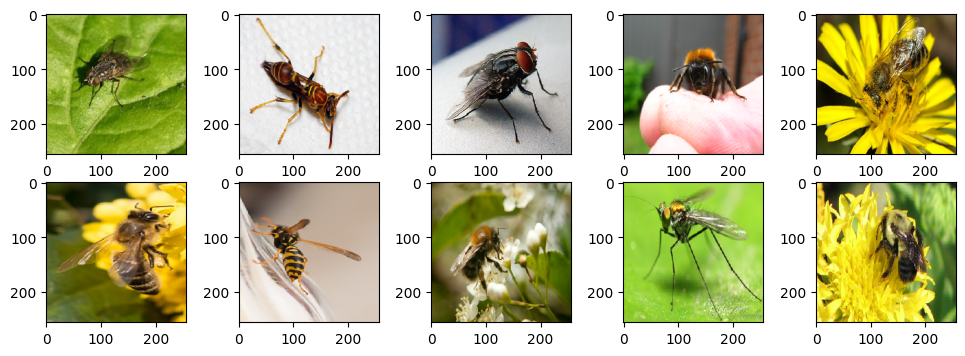

In [ ]:
plt.figure(figsize=(12, 4))
for i in range(10):
    plt.subplot(2, 5, i+1)
    print(X[i].shape)
    plt.imshow(X[i])
plt.show()

In [ ]:
avg_loss = tf.keras.metrics.Mean('loss', dtype=tf.float32)
#print(tf.eagerly())
def loss_fn(y_true, y_pred):
  losses = []
  usedPrediction = []
  mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
  result = mse(y_true[0], y_pred[0])
  out = result.numpy()
  #tf.print(out.shape, output_stream=sys.stdout)
  #sess = tf.Session()
  for index in range(0, int(len(y_true)/2)):
    predictValue = y_pred[index*2]
    minDifference = 10000
    minDiffIndex = 0
    for index2 in range(0, int(len(y_true)/2)):
      if(index2 in usedPrediction): continue
      pass
      #print(tf.get_static_value(y_true[(index2*2)]))
      #posDiff = abs(y_true[(index2*2)][0]-predictValue[0])
      #posDiff += abs(y_true[(index2*2)][1]-predictValue[1])
      #posDiff += abs(y_true[(index2*2)][2]-predictValue[2])
      #posDiff += abs(y_true[(index2*2)][3]-predictValue[3])
      #print(y_true[(index2*2)]- predictValue)
      #tf.print("All", output_stream=sys.stdout)
      #tf.print(y_pred, output_stream=sys.stdout)
      #tf.print("Index", output_stream=sys.stdout)
      #tf.print(predictValue, output_stream=sys.stdout)
      #tf.print("Single", output_stream=sys.stdout)
      #out = y_pred[0].numpy()
      #tf.print(y_pred)
      #tf.print(out.shape, output_stream=sys.stdout)
      #tf.print(type(out), output_stream=sys.stdout)
      #print(predictValue[0])
      #print(type(predictValue[0]))
      #with tf.GradientTape() as tape:
      #activDiv = mse(y_true[(index2*2)], predictValue)
      #  gradients = tape.gradient(activDiv)
      #  avg_loss = tf.keras.metrics.Mean('loss', dtype=tf.float32)
      #  print(activDiv)
      #  print(type(activDiv))

      #a = tf.constant(activDiv)
      #with sess.as_default():   # or `with sess:` to close on exit
        #activDiv.eval()  # runs one step
        #sess.run(activDiv)
      #print(activDiv.numpy())
      #activeDiv = tf.constant(activeDiv)
      #activeDiv tf.get_static_value(activeDiv)
      #print(posDiff.eval())
      #print(type(posDiff))
      #print(posDiff)
      #if(tf.math.greater(activDiv, minDifference)):
      #if((y_pred < minDifference)):
        #pass
        #minDifference = activDiv#posDiff
        #minDiffIndex = index2
        #print(y_true)
        #print(len(y_true))
    usedPrediction.append(minDiffIndex)
    a = mse(y_true[(minDiffIndex*2)], y_pred[(minDiffIndex*2)])#.numpy()#tf.keras.losses.binary_crossentropy(y_true[index*2], y_pred[index*2])
    losses.append(a)
    b = tf.keras.losses.binary_crossentropy(y_true[(minDiffIndex*2)+1], y_pred[(minDiffIndex*2)+1])
    losses.append(b)
        #b = tf.square(y_true[0] - y_pred[1]) * y_true[1]
        #b = tf.reduce_sum(b, axis=(1, 2, 3))
        #c = tf.abs(y_true[1] - y_pred[2]) * y_true[1]
        #c = tf.reduce_sum(c, axis=1)
  return losses

class CustomModel(tf.keras.Model):
    def train_step(self, data):
        # Unpack the data. Its structure depends on your model and
        # on what you pass to `fit()`.
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            # Compute the loss value
            # (the loss function is configured in `compile()`)
            #tf.print(y_pred, output_stream=sys.stdout)
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)
            #loss = tf.math.reduce_mean(tf.math.square(tf.math.subtract(y,y_pred)))
            #loss = loss_fn(y, y_pred)
            #mse = tf.keras.losses.MeanSquaredError()
            #loss = mse(y, y_pred)
            #loss = tf.keras.losses.MeanSquaredError(y, y_pred)
            #print(loss)
            #print(type(loss))
            #tf.print(loss, output_stream=sys.stdout)
            #tf.print(type(loss), output_stream=sys.stdout)

        # Compute gradients
        trainable_vars = self.trainable_variables
        #tf.print(trainable_vars, output_stream=sys.stdout)
        #tf.print(type(trainable_vars), output_stream=sys.stdout)
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        # Update metrics (includes the metric that tracks the loss)
        self.compiled_metrics.update_state(y, y_pred)
        # Return a dict mapping metric names to current value
        return {m.name: m.result() for m in self.metrics}

class custom_fit(tf.keras.Model):
    def train_step(self, data):
        images, labels = data
        with tf.GradientTape() as tape:
            outputs = self(images, training=True) # forward pass
            reg_loss = tf.reduce_sum(self.losses)
            pred_loss = loss_fn(labels, outputs)
            #print(pred_loss)
            total_loss = tf.reduce_sum(pred_loss) + reg_loss
            #print(total_loss)
            #print(self.trainable_variables)
        #gradients = tape.gradient(total_loss, self.trainable_variables)
        gradients = tape.gradient(pred_loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        #avg_loss.update_state(total_loss)
        avg_loss.update_state(pred_loss)
        return {"loss": avg_loss.result()}

    @property
    def metrics(self):
        # We list our `Metric` objects here so that `reset_states()` can be
        # called automatically at the start of each epoch
        # or at the start of `evaluate()`.
        # If you don't implement this property, you have to call
        # `reset_states()` yourself at the time of your choosing.
        return [avg_loss]

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense
from tensorflow.keras.layers import Flatten, Dropout
from tensorflow.keras import Input, Model

encoder_input = Input(shape=(targetSizeElement, targetSizeElement, 3))

imgAdjust = RandomFlip("horizontal_and_vertical")(encoder_input)
imgAdjust= RandomRotation(0.5)(imgAdjust)
imgAdjust = RandomZoom(.5, .2)(imgAdjust)
imgAdjust = RandomBrightness(0.5)(imgAdjust)
imgAdjust = Rescaling(1./255)(imgAdjust)

x = Conv2D(32, kernel_size=7, activation="relu", padding="same",input_shape=(targetSizeElement, targetSizeElement, 3))(imgAdjust)
x = MaxPooling2D( pool_size=2)(x)
x = Conv2D( 32, kernel_size=7, activation="relu", padding="same")(x)
x = MaxPooling2D( pool_size=2)(x)

x_small = Flatten()(x)
x_small = Dropout(0.5)(x_small)

x_more = Conv2D( 64, kernel_size=3, activation="relu", padding="same")(x)
x_more = MaxPooling2D( pool_size=2)(x_more)
x_more = Conv2D( 128, kernel_size=3, activation="relu", padding="same")(x_more)
x_more = MaxPooling2D( pool_size=2)(x_more)
x_more = Conv2D( 256, kernel_size=3, activation="relu", padding="same")(x_more)
x_more = MaxPooling2D( pool_size=2)(x_more)

x_more = Flatten()(x_more)
x_more = Dropout(0.5)(x_more)
x_more = Dense(1440, name=f"location{count}", padding="same")(x_more)

#x = Dense(4)(x)

OutPutList = []
lossList = []
lossList.append("mse")
OutPutList.append(Dense(1, name=f"moreObjects", padding="same")(x_small))
for count in range(maxImages):
  #print(count)
  OutPutList.append(Dense(4, name=f"location{count}", padding="same")(x_more))
  lossList.append("mse")
  OutPutList.append(Dense(len(Classlist), activation='sigmoid', name=f"prediction{count}", padding="same")(x_small))
  lossList.append("categorical_crossentropy")
#output1 = Dense(4)(x)
#output2 = Dense(4, activation='sigmoid')(x)

model = CustomModel(encoder_input, OutPutList)

# Include the epoch in the file name (uses `str.format`)
checkpoint_path = "/content/drive/MyDrive/tf_workspace/"+modelFolderName+"/checkpoints/cp-{epoch:04d}.ckpt"
log_dir = "/content/drive/MyDrive/tf_workspace/"+modelFolderName+"/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logs_folder = f"/content/drive/MyDrive/tf_workspace/{modelFolderName}/logs"
checkpoint_dir = os.path.dirname(checkpoint_path)
# Create a callback that saves the model's weights every 5 epochs
cp_callback = [
    tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1),
]

if(CONTINUOUS_SAVE):
  cp_callback.append(
  tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=1,
    save_weights_only=True,
    save_freq=125*10),#len(train_dataset)*STEPS_BETWEEN_SAVES),#*batch_size),
    )
else:
  cp_callback.append(
    tf.keras.callbacks.ModelCheckpoint(
      filepath=checkpoint_path,
      save_weights_only=True,
      monitor='val_accuracy',
      mode='max',
      save_best_only=True),
  )

if(EARLY_STOP):
  cp_callback.append(tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=200))
#model.trainable = False
# Save the weights using the `checkpoint_path` format
model.save_weights(checkpoint_path.format(epoch=0))

model.compile("adam", loss=lossList, metrics=["accuracy", "binary_crossentropy"],run_eagerly=True)

In [ ]:
#%%time
history = model.fit(X_train, Y_train,
                    epochs=training_epochs,
                    callbacks=[cp_callback],
                    validation_data=(X_val, Y_val))

Epoch 1/50
125/125 [==============================] - ETA: 0s - loss: 623.6390 - moreObjects_loss: 0.1501 - location0_loss: 622.1364 - prediction0_loss: 1.3525 - moreObjects_accuracy: 0.9368 - moreObjects_binary_crossentropy: 0.5259 - location0_accuracy: 0.3702 - location0_binary_crossentropy: -609.1440 - prediction0_accuracy: 0.4404 - prediction0_binary_crossentropy: 0.8162

125/125 [==============================] - 18s 130ms/step - loss: 623.6390 - moreObjects_loss: 0.1501 - location0_loss: 622.1364 - prediction0_loss: 1.3525 - moreObjects_accuracy: 0.9368 - moreObjects_binary_crossentropy: 0.5259 - location0_accuracy: 0.3702 - location0_binary_crossentropy: -609.1440 - prediction0_accuracy: 0.4404 - prediction0_binary_crossentropy: 0.8162 - val_loss: 381.3091 - val_moreObjects_loss: 0.1117 - val_location0_loss: 378.6034 - val_prediction0_loss: 2.5939 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 1.0441
Epoch 2/50
125/125 [==============================] - ETA: 0s - loss: 306.9583 - moreObjects_loss: 0.0697 - location0_loss: 305.6811 - prediction0_loss: 1.2074 - moreObjects_accuracy: 0.9609 - moreObjects_binary_crossentropy: 0.3437 - location0_accuracy: 0.3521 - locati

125/125 [==============================] - 16s 126ms/step - loss: 306.9583 - moreObjects_loss: 0.0697 - location0_loss: 305.6811 - prediction0_loss: 1.2074 - moreObjects_accuracy: 0.9609 - moreObjects_binary_crossentropy: 0.3437 - location0_accuracy: 0.3521 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.4719 - prediction0_binary_crossentropy: 0.7338 - val_loss: 369.3815 - val_moreObjects_loss: 0.1017 - val_location0_loss: 367.3092 - val_prediction0_loss: 1.9706 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8521
Epoch 3/50
125/125 [==============================] - ETA: 0s - loss: 301.5091 - moreObjects_loss: 0.0673 - location0_loss: 300.1317 - prediction0_loss: 1.3101 - moreObjects_accuracy: 0.9634 - moreObjects_binary_crossentropy: 0.3380 - location0_accuracy: 0.3717 - locati

125/125 [==============================] - 17s 134ms/step - loss: 301.5091 - moreObjects_loss: 0.0673 - location0_loss: 300.1317 - prediction0_loss: 1.3101 - moreObjects_accuracy: 0.9634 - moreObjects_binary_crossentropy: 0.3380 - location0_accuracy: 0.3717 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.4331 - prediction0_binary_crossentropy: 0.7571 - val_loss: 344.8513 - val_moreObjects_loss: 0.0844 - val_location0_loss: 342.4088 - val_prediction0_loss: 2.3580 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3110 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 1.0040
Epoch 4/50
125/125 [==============================] - ETA: 0s - loss: 304.4152 - moreObjects_loss: 0.0577 - location0_loss: 303.1133 - prediction0_loss: 1.2443 - moreObjects_accuracy: 0.9689 - moreObjects_binary_crossentropy: 0.3286 - location0_accuracy: 0.3519 - locati

125/125 [==============================] - 17s 133ms/step - loss: 304.4152 - moreObjects_loss: 0.0577 - location0_loss: 303.1133 - prediction0_loss: 1.2443 - moreObjects_accuracy: 0.9689 - moreObjects_binary_crossentropy: 0.3286 - location0_accuracy: 0.3519 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.4449 - prediction0_binary_crossentropy: 0.7224 - val_loss: 358.7482 - val_moreObjects_loss: 0.0848 - val_location0_loss: 356.6728 - val_prediction0_loss: 1.9906 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3129 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.1655 - val_prediction0_binary_crossentropy: 0.9046
Epoch 5/50
125/125 [==============================] - ETA: 0s - loss: 300.2225 - moreObjects_loss: 0.0587 - location0_loss: 298.9306 - prediction0_loss: 1.2332 - moreObjects_accuracy: 0.9667 - moreObjects_binary_crossentropy: 0.3306 - location0_accuracy: 0.3566 - locati

125/125 [==============================] - 16s 128ms/step - loss: 300.2225 - moreObjects_loss: 0.0587 - location0_loss: 298.9306 - prediction0_loss: 1.2332 - moreObjects_accuracy: 0.9667 - moreObjects_binary_crossentropy: 0.3306 - location0_accuracy: 0.3566 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.4534 - prediction0_binary_crossentropy: 0.7108 - val_loss: 387.0035 - val_moreObjects_loss: 0.1004 - val_location0_loss: 385.3080 - val_prediction0_loss: 1.5950 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8115
Epoch 6/50
125/125 [==============================] - ETA: 0s - loss: 296.4041 - moreObjects_loss: 0.0563 - location0_loss: 295.1089 - prediction0_loss: 1.2387 - moreObjects_accuracy: 0.9692 - moreObjects_binary_crossentropy: 0.3567 - location0_accuracy: 0.3719 - locati

125/125 [==============================] - 16s 129ms/step - loss: 296.4041 - moreObjects_loss: 0.0563 - location0_loss: 295.1089 - prediction0_loss: 1.2387 - moreObjects_accuracy: 0.9692 - moreObjects_binary_crossentropy: 0.3567 - location0_accuracy: 0.3719 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.4444 - prediction0_binary_crossentropy: 0.6991 - val_loss: 407.6377 - val_moreObjects_loss: 0.1201 - val_location0_loss: 405.4876 - val_prediction0_loss: 2.0299 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8999
Epoch 7/50
125/125 [==============================] - ETA: 0s - loss: 294.4400 - moreObjects_loss: 0.0495 - location0_loss: 293.1530 - prediction0_loss: 1.2377 - moreObjects_accuracy: 0.9697 - moreObjects_binary_crossentropy: 0.3358 - location0_accuracy: 0.3714 - locati

125/125 [==============================] - 16s 126ms/step - loss: 294.4400 - moreObjects_loss: 0.0495 - location0_loss: 293.1530 - prediction0_loss: 1.2377 - moreObjects_accuracy: 0.9697 - moreObjects_binary_crossentropy: 0.3358 - location0_accuracy: 0.3714 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.4546 - prediction0_binary_crossentropy: 0.6889 - val_loss: 404.1350 - val_moreObjects_loss: 0.0951 - val_location0_loss: 401.9078 - val_prediction0_loss: 2.1322 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.9129
Epoch 8/50
125/125 [==============================] - ETA: 0s - loss: 296.3473 - moreObjects_loss: 0.0459 - location0_loss: 295.1135 - prediction0_loss: 1.1879 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2952 - location0_accuracy: 0.3627 - locati

125/125 [==============================] - 16s 126ms/step - loss: 296.3473 - moreObjects_loss: 0.0459 - location0_loss: 295.1135 - prediction0_loss: 1.1879 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2952 - location0_accuracy: 0.3627 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.4779 - prediction0_binary_crossentropy: 0.6724 - val_loss: 411.5046 - val_moreObjects_loss: 0.1046 - val_location0_loss: 409.5618 - val_prediction0_loss: 1.8383 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8140
Epoch 9/50
125/125 [==============================] - ETA: 0s - loss: 293.4362 - moreObjects_loss: 0.0453 - location0_loss: 292.1829 - prediction0_loss: 1.2080 - moreObjects_accuracy: 0.9712 - moreObjects_binary_crossentropy: 0.3137 - location0_accuracy: 0.3704 - locati

125/125 [==============================] - 16s 129ms/step - loss: 293.4362 - moreObjects_loss: 0.0453 - location0_loss: 292.1829 - prediction0_loss: 1.2080 - moreObjects_accuracy: 0.9712 - moreObjects_binary_crossentropy: 0.3137 - location0_accuracy: 0.3704 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.4707 - prediction0_binary_crossentropy: 0.6531 - val_loss: 354.1273 - val_moreObjects_loss: 0.0971 - val_location0_loss: 351.9159 - val_prediction0_loss: 2.1141 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8475
Epoch 10/50
124/125 [============================>.] - ETA: 0s - loss: 299.1063 - moreObjects_loss: 0.0402 - location0_loss: 297.8836 - prediction0_loss: 1.1824 - moreObjects_accuracy: 0.9708 - moreObjects_binary_crossentropy: 0.2677 - location0_accuracy: 0.3634 - locat

125/125 [==============================] - 16s 131ms/step - loss: 299.2875 - moreObjects_loss: 0.0401 - location0_loss: 298.0651 - prediction0_loss: 1.1823 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2663 - location0_accuracy: 0.3629 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.4837 - prediction0_binary_crossentropy: 0.6452 - val_loss: 384.0877 - val_moreObjects_loss: 0.0872 - val_location0_loss: 382.1790 - val_prediction0_loss: 1.8215 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3439 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7912
Epoch 11/50
125/125 [==============================] - ETA: 0s - loss: 293.0251 - moreObjects_loss: 0.0361 - location0_loss: 291.8179 - prediction0_loss: 1.1710 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2715 - location0_accuracy: 0.3602 - locat

125/125 [==============================] - 16s 126ms/step - loss: 293.0251 - moreObjects_loss: 0.0361 - location0_loss: 291.8179 - prediction0_loss: 1.1710 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2715 - location0_accuracy: 0.3602 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.4917 - prediction0_binary_crossentropy: 0.6346 - val_loss: 379.2923 - val_moreObjects_loss: 0.0909 - val_location0_loss: 377.5198 - val_prediction0_loss: 1.6817 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.4524 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7560
Epoch 12/50
125/125 [==============================] - ETA: 0s - loss: 293.2382 - moreObjects_loss: 0.0333 - location0_loss: 292.0408 - prediction0_loss: 1.1642 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2676 - location0_accuracy: 0.3717 - locat

125/125 [==============================] - 16s 125ms/step - loss: 293.2382 - moreObjects_loss: 0.0333 - location0_loss: 292.0408 - prediction0_loss: 1.1642 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2676 - location0_accuracy: 0.3717 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.4937 - prediction0_binary_crossentropy: 0.6274 - val_loss: 374.5438 - val_moreObjects_loss: 0.0883 - val_location0_loss: 372.6642 - val_prediction0_loss: 1.7913 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3637 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7662
Epoch 13/50
125/125 [==============================] - ETA: 0s - loss: 292.2884 - moreObjects_loss: 0.0328 - location0_loss: 291.1088 - prediction0_loss: 1.1468 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2588 - location0_accuracy: 0.3607 - locat

125/125 [==============================] - 16s 126ms/step - loss: 292.2884 - moreObjects_loss: 0.0328 - location0_loss: 291.1088 - prediction0_loss: 1.1468 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2588 - location0_accuracy: 0.3607 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5130 - prediction0_binary_crossentropy: 0.6133 - val_loss: 369.0868 - val_moreObjects_loss: 0.0899 - val_location0_loss: 367.1436 - val_prediction0_loss: 1.8533 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.4057 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7895
Epoch 14/50
125/125 [==============================] - ETA: 0s - loss: 290.2873 - moreObjects_loss: 0.0320 - location0_loss: 289.1041 - prediction0_loss: 1.1511 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2675 - location0_accuracy: 0.3629 - locat

125/125 [==============================] - 16s 126ms/step - loss: 290.2873 - moreObjects_loss: 0.0320 - location0_loss: 289.1041 - prediction0_loss: 1.1511 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2675 - location0_accuracy: 0.3629 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5035 - prediction0_binary_crossentropy: 0.6103 - val_loss: 369.4016 - val_moreObjects_loss: 0.0923 - val_location0_loss: 367.4306 - val_prediction0_loss: 1.8787 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7754
Epoch 15/50
125/125 [==============================] - ETA: 0s - loss: 287.2939 - moreObjects_loss: 0.0317 - location0_loss: 286.1127 - prediction0_loss: 1.1496 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2433 - location0_accuracy: 0.3566 - locat

125/125 [==============================] - 16s 127ms/step - loss: 287.2939 - moreObjects_loss: 0.0317 - location0_loss: 286.1127 - prediction0_loss: 1.1496 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2433 - location0_accuracy: 0.3566 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5058 - prediction0_binary_crossentropy: 0.6074 - val_loss: 388.4300 - val_moreObjects_loss: 0.0929 - val_location0_loss: 386.3929 - val_prediction0_loss: 1.9442 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8017
Epoch 16/50
125/125 [==============================] - ETA: 0s - loss: 290.6454 - moreObjects_loss: 0.0332 - location0_loss: 289.4644 - prediction0_loss: 1.1478 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2379 - location0_accuracy: 0.3564 - locat

125/125 [==============================] - 15s 124ms/step - loss: 290.6454 - moreObjects_loss: 0.0332 - location0_loss: 289.4644 - prediction0_loss: 1.1478 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2379 - location0_accuracy: 0.3564 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5123 - prediction0_binary_crossentropy: 0.6052 - val_loss: 428.0855 - val_moreObjects_loss: 0.0942 - val_location0_loss: 426.0610 - val_prediction0_loss: 1.9303 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8024
Epoch 17/50
125/125 [==============================] - ETA: 0s - loss: 287.7719 - moreObjects_loss: 0.0304 - location0_loss: 286.6037 - prediction0_loss: 1.1377 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2308 - location0_accuracy: 0.3596 - locat

125/125 [==============================] - 16s 125ms/step - loss: 287.7719 - moreObjects_loss: 0.0304 - location0_loss: 286.6037 - prediction0_loss: 1.1377 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2308 - location0_accuracy: 0.3596 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5063 - prediction0_binary_crossentropy: 0.5997 - val_loss: 399.5827 - val_moreObjects_loss: 0.0855 - val_location0_loss: 397.4052 - val_prediction0_loss: 2.0920 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3226 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8384
Epoch 18/50
125/125 [==============================] - ETA: 0s - loss: 288.8130 - moreObjects_loss: 0.0305 - location0_loss: 287.6392 - prediction0_loss: 1.1434 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2419 - location0_accuracy: 0.3619 - locat

125/125 [==============================] - 16s 126ms/step - loss: 288.8130 - moreObjects_loss: 0.0305 - location0_loss: 287.6392 - prediction0_loss: 1.1434 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2419 - location0_accuracy: 0.3619 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5125 - prediction0_binary_crossentropy: 0.5995 - val_loss: 371.6606 - val_moreObjects_loss: 0.0955 - val_location0_loss: 369.7762 - val_prediction0_loss: 1.7890 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7612
Epoch 19/50
125/125 [==============================] - ETA: 0s - loss: 287.8066 - moreObjects_loss: 0.0304 - location0_loss: 286.6346 - prediction0_loss: 1.1417 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2480 - location0_accuracy: 0.3707 - locat

125/125 [==============================] - 16s 126ms/step - loss: 287.8066 - moreObjects_loss: 0.0304 - location0_loss: 286.6346 - prediction0_loss: 1.1417 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2480 - location0_accuracy: 0.3707 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5145 - prediction0_binary_crossentropy: 0.5974 - val_loss: 388.2083 - val_moreObjects_loss: 0.0844 - val_location0_loss: 386.1036 - val_prediction0_loss: 2.0202 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3127 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.8111
Epoch 20/50
124/125 [============================>.] - ETA: 0s - loss: 290.1714 - moreObjects_loss: 0.0295 - location0_loss: 289.0060 - prediction0_loss: 1.1360 - moreObjects_accuracy: 0.9713 - moreObjects_binary_crossentropy: 0.2242 - location0_accuracy: 0.3682 - locat

125/125 [==============================] - 16s 130ms/step - loss: 290.4300 - moreObjects_loss: 0.0298 - location0_loss: 289.2636 - prediction0_loss: 1.1367 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2245 - location0_accuracy: 0.3684 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5153 - prediction0_binary_crossentropy: 0.5947 - val_loss: 375.4362 - val_moreObjects_loss: 0.0840 - val_location0_loss: 373.6044 - val_prediction0_loss: 1.7478 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3095 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7415
Epoch 21/50
125/125 [==============================] - ETA: 0s - loss: 289.2827 - moreObjects_loss: 0.0301 - location0_loss: 288.1206 - prediction0_loss: 1.1319 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2294 - location0_accuracy: 0.3531 - locat

125/125 [==============================] - 16s 125ms/step - loss: 289.2827 - moreObjects_loss: 0.0301 - location0_loss: 288.1206 - prediction0_loss: 1.1319 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2294 - location0_accuracy: 0.3531 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5905 - val_loss: 357.6778 - val_moreObjects_loss: 0.0864 - val_location0_loss: 355.7821 - val_prediction0_loss: 1.8093 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3330 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7627
Epoch 22/50
125/125 [==============================] - ETA: 0s - loss: 286.2386 - moreObjects_loss: 0.0296 - location0_loss: 285.0774 - prediction0_loss: 1.1318 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2125 - location0_accuracy: 0.3774 - locat

125/125 [==============================] - 16s 125ms/step - loss: 286.2386 - moreObjects_loss: 0.0296 - location0_loss: 285.0774 - prediction0_loss: 1.1318 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2125 - location0_accuracy: 0.3774 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5158 - prediction0_binary_crossentropy: 0.5891 - val_loss: 418.1361 - val_moreObjects_loss: 0.0877 - val_location0_loss: 416.3727 - val_prediction0_loss: 1.6757 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3521 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7269
Epoch 23/50
125/125 [==============================] - ETA: 0s - loss: 289.1752 - moreObjects_loss: 0.0293 - location0_loss: 288.0136 - prediction0_loss: 1.1323 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2081 - location0_accuracy: 0.3634 - locat

125/125 [==============================] - 16s 125ms/step - loss: 289.1752 - moreObjects_loss: 0.0293 - location0_loss: 288.0136 - prediction0_loss: 1.1323 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2081 - location0_accuracy: 0.3634 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5894 - val_loss: 382.3198 - val_moreObjects_loss: 0.0949 - val_location0_loss: 380.3585 - val_prediction0_loss: 1.8665 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 1.4234 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7706
Epoch 24/50
125/125 [==============================] - ETA: 0s - loss: 289.1124 - moreObjects_loss: 0.0294 - location0_loss: 287.9467 - prediction0_loss: 1.1364 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2027 - location0_accuracy: 0.3717 - locat

125/125 [==============================] - 16s 126ms/step - loss: 289.1124 - moreObjects_loss: 0.0294 - location0_loss: 287.9467 - prediction0_loss: 1.1364 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.2027 - location0_accuracy: 0.3717 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5875 - val_loss: 390.9314 - val_moreObjects_loss: 0.0856 - val_location0_loss: 389.0114 - val_prediction0_loss: 1.8345 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3232 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7593
Epoch 25/50
125/125 [==============================] - ETA: 0s - loss: 288.5965 - moreObjects_loss: 0.0291 - location0_loss: 287.4366 - prediction0_loss: 1.1309 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1872 - location0_accuracy: 0.3649 - locat

125/125 [==============================] - 16s 125ms/step - loss: 288.5965 - moreObjects_loss: 0.0291 - location0_loss: 287.4366 - prediction0_loss: 1.1309 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1872 - location0_accuracy: 0.3649 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5852 - val_loss: 368.9416 - val_moreObjects_loss: 0.0915 - val_location0_loss: 366.9951 - val_prediction0_loss: 1.8550 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.5044 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7650
Epoch 26/50
125/125 [==============================] - ETA: 0s - loss: 289.7726 - moreObjects_loss: 0.0291 - location0_loss: 288.6139 - prediction0_loss: 1.1296 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1882 - location0_accuracy: 0.3574 - locat

125/125 [==============================] - 16s 125ms/step - loss: 289.7726 - moreObjects_loss: 0.0291 - location0_loss: 288.6139 - prediction0_loss: 1.1296 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1882 - location0_accuracy: 0.3574 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5836 - val_loss: 407.3335 - val_moreObjects_loss: 0.0887 - val_location0_loss: 405.4432 - val_prediction0_loss: 1.8015 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3733 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7487
Epoch 27/50
125/125 [==============================] - ETA: 0s - loss: 290.8560 - moreObjects_loss: 0.0288 - location0_loss: 289.6988 - prediction0_loss: 1.1284 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1707 - location0_accuracy: 0.3677 - locat

125/125 [==============================] - 16s 124ms/step - loss: 290.8560 - moreObjects_loss: 0.0288 - location0_loss: 289.6988 - prediction0_loss: 1.1284 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1707 - location0_accuracy: 0.3677 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5807 - val_loss: 380.7748 - val_moreObjects_loss: 0.0910 - val_location0_loss: 378.9141 - val_prediction0_loss: 1.7697 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.4636 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7382
Epoch 28/50
125/125 [==============================] - ETA: 0s - loss: 288.7327 - moreObjects_loss: 0.0288 - location0_loss: 287.5763 - prediction0_loss: 1.1277 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1873 - location0_accuracy: 0.3612 - locat

125/125 [==============================] - 16s 126ms/step - loss: 288.7327 - moreObjects_loss: 0.0288 - location0_loss: 287.5763 - prediction0_loss: 1.1277 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1873 - location0_accuracy: 0.3612 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5795 - val_loss: 370.6639 - val_moreObjects_loss: 0.0898 - val_location0_loss: 368.8327 - val_prediction0_loss: 1.7414 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.4028 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7297
Epoch 29/50
125/125 [==============================] - ETA: 0s - loss: 288.9793 - moreObjects_loss: 0.0286 - location0_loss: 287.8229 - prediction0_loss: 1.1277 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1607 - location0_accuracy: 0.3529 - locat

125/125 [==============================] - 16s 127ms/step - loss: 288.9793 - moreObjects_loss: 0.0286 - location0_loss: 287.8229 - prediction0_loss: 1.1277 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1607 - location0_accuracy: 0.3529 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5790 - val_loss: 413.4500 - val_moreObjects_loss: 0.0892 - val_location0_loss: 411.5503 - val_prediction0_loss: 1.8106 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3860 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7484
Epoch 30/50
124/125 [============================>.] - ETA: 0s - loss: 288.5884 - moreObjects_loss: 0.0288 - location0_loss: 287.4293 - prediction0_loss: 1.1302 - moreObjects_accuracy: 0.9708 - moreObjects_binary_crossentropy: 0.1684 - location0_accuracy: 0.3566 - locat

125/125 [==============================] - 16s 129ms/step - loss: 288.4515 - moreObjects_loss: 0.0287 - location0_loss: 287.2930 - prediction0_loss: 1.1297 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1676 - location0_accuracy: 0.3559 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5790 - val_loss: 383.5565 - val_moreObjects_loss: 0.0916 - val_location0_loss: 381.6989 - val_prediction0_loss: 1.7662 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.5183 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7373
Epoch 31/50
125/125 [==============================] - ETA: 0s - loss: 289.2674 - moreObjects_loss: 0.0286 - location0_loss: 288.1110 - prediction0_loss: 1.1277 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1611 - location0_accuracy: 0.3564 - locat

125/125 [==============================] - 16s 126ms/step - loss: 289.2674 - moreObjects_loss: 0.0286 - location0_loss: 288.1110 - prediction0_loss: 1.1277 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1611 - location0_accuracy: 0.3564 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5774 - val_loss: 379.2430 - val_moreObjects_loss: 0.0869 - val_location0_loss: 377.3328 - val_prediction0_loss: 1.8232 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3403 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7509
Epoch 32/50
125/125 [==============================] - ETA: 0s - loss: 285.4574 - moreObjects_loss: 0.0286 - location0_loss: 284.3019 - prediction0_loss: 1.1269 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1480 - location0_accuracy: 0.3697 - locat

125/125 [==============================] - 16s 127ms/step - loss: 285.4574 - moreObjects_loss: 0.0286 - location0_loss: 284.3019 - prediction0_loss: 1.1269 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1480 - location0_accuracy: 0.3697 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5770 - val_loss: 409.5991 - val_moreObjects_loss: 0.0869 - val_location0_loss: 407.7549 - val_prediction0_loss: 1.7573 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3391 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7348
Epoch 33/50
125/125 [==============================] - ETA: 0s - loss: 287.2510 - moreObjects_loss: 0.0284 - location0_loss: 286.0957 - prediction0_loss: 1.1270 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1469 - location0_accuracy: 0.3571 - locat

125/125 [==============================] - 16s 125ms/step - loss: 287.2510 - moreObjects_loss: 0.0284 - location0_loss: 286.0957 - prediction0_loss: 1.1270 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1469 - location0_accuracy: 0.3571 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5769 - val_loss: 400.4561 - val_moreObjects_loss: 0.0895 - val_location0_loss: 398.5813 - val_prediction0_loss: 1.7852 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3942 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7405
Epoch 34/50
125/125 [==============================] - ETA: 0s - loss: 288.3602 - moreObjects_loss: 0.0285 - location0_loss: 287.2055 - prediction0_loss: 1.1262 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1476 - location0_accuracy: 0.3622 - locat

125/125 [==============================] - 16s 125ms/step - loss: 288.3602 - moreObjects_loss: 0.0285 - location0_loss: 287.2055 - prediction0_loss: 1.1262 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1476 - location0_accuracy: 0.3622 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5764 - val_loss: 360.8104 - val_moreObjects_loss: 0.0865 - val_location0_loss: 358.9245 - val_prediction0_loss: 1.7994 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3339 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7426
Epoch 35/50
125/125 [==============================] - ETA: 0s - loss: 285.6614 - moreObjects_loss: 0.0284 - location0_loss: 284.5062 - prediction0_loss: 1.1267 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1354 - location0_accuracy: 0.3609 - locat

125/125 [==============================] - 16s 125ms/step - loss: 285.6614 - moreObjects_loss: 0.0284 - location0_loss: 284.5062 - prediction0_loss: 1.1267 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1354 - location0_accuracy: 0.3609 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5760 - val_loss: 362.7021 - val_moreObjects_loss: 0.0867 - val_location0_loss: 360.7586 - val_prediction0_loss: 1.8568 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3366 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7554
Epoch 36/50
125/125 [==============================] - ETA: 0s - loss: 288.2802 - moreObjects_loss: 0.0284 - location0_loss: 287.1246 - prediction0_loss: 1.1271 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1374 - location0_accuracy: 0.3501 - locat

125/125 [==============================] - 16s 125ms/step - loss: 288.2802 - moreObjects_loss: 0.0284 - location0_loss: 287.1246 - prediction0_loss: 1.1271 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1374 - location0_accuracy: 0.3501 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5756 - val_loss: 386.7086 - val_moreObjects_loss: 0.0884 - val_location0_loss: 384.8377 - val_prediction0_loss: 1.7826 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3655 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7379
Epoch 37/50
125/125 [==============================] - ETA: 0s - loss: 287.9014 - moreObjects_loss: 0.0284 - location0_loss: 286.7458 - prediction0_loss: 1.1274 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1347 - location0_accuracy: 0.3586 - locat

125/125 [==============================] - 15s 123ms/step - loss: 287.9014 - moreObjects_loss: 0.0284 - location0_loss: 286.7458 - prediction0_loss: 1.1274 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1347 - location0_accuracy: 0.3586 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5760 - val_loss: 394.3875 - val_moreObjects_loss: 0.0894 - val_location0_loss: 392.4795 - val_prediction0_loss: 1.8186 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3914 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7479
Epoch 38/50
125/125 [==============================] - ETA: 0s - loss: 289.3082 - moreObjects_loss: 0.0284 - location0_loss: 288.1539 - prediction0_loss: 1.1258 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1351 - location0_accuracy: 0.3652 - locat

125/125 [==============================] - 15s 124ms/step - loss: 289.3082 - moreObjects_loss: 0.0284 - location0_loss: 288.1539 - prediction0_loss: 1.1258 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1351 - location0_accuracy: 0.3652 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5758 - val_loss: 373.9063 - val_moreObjects_loss: 0.0891 - val_location0_loss: 372.0318 - val_prediction0_loss: 1.7855 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3818 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7392
Epoch 39/50
125/125 [==============================] - ETA: 0s - loss: 287.6845 - moreObjects_loss: 0.0283 - location0_loss: 286.5304 - prediction0_loss: 1.1259 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1335 - location0_accuracy: 0.3714 - locat

125/125 [==============================] - 15s 124ms/step - loss: 287.6845 - moreObjects_loss: 0.0283 - location0_loss: 286.5304 - prediction0_loss: 1.1259 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1335 - location0_accuracy: 0.3714 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5743 - val_loss: 393.3014 - val_moreObjects_loss: 0.0874 - val_location0_loss: 391.4534 - val_prediction0_loss: 1.7606 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3470 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7347
Epoch 40/50
124/125 [============================>.] - ETA: 0s - loss: 288.3918 - moreObjects_loss: 0.0285 - location0_loss: 287.2353 - prediction0_loss: 1.1280 - moreObjects_accuracy: 0.9708 - moreObjects_binary_crossentropy: 0.1344 - location0_accuracy: 0.3594 - locat

125/125 [==============================] - 16s 129ms/step - loss: 288.5083 - moreObjects_loss: 0.0283 - location0_loss: 287.3521 - prediction0_loss: 1.1279 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1339 - location0_accuracy: 0.3589 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5759 - val_loss: 410.1633 - val_moreObjects_loss: 0.0876 - val_location0_loss: 408.2265 - val_prediction0_loss: 1.8492 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3508 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7552
Epoch 41/50
125/125 [==============================] - ETA: 0s - loss: 292.3897 - moreObjects_loss: 0.0283 - location0_loss: 291.2339 - prediction0_loss: 1.1275 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1324 - location0_accuracy: 0.3551 - locat

125/125 [==============================] - 16s 124ms/step - loss: 292.3897 - moreObjects_loss: 0.0283 - location0_loss: 291.2339 - prediction0_loss: 1.1275 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1324 - location0_accuracy: 0.3551 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5773 - val_loss: 378.4161 - val_moreObjects_loss: 0.0864 - val_location0_loss: 376.5755 - val_prediction0_loss: 1.7543 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3327 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7312
Epoch 42/50
125/125 [==============================] - ETA: 0s - loss: 287.7405 - moreObjects_loss: 0.0283 - location0_loss: 286.5862 - prediction0_loss: 1.1261 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1335 - location0_accuracy: 0.3511 - locat

125/125 [==============================] - 16s 125ms/step - loss: 287.7405 - moreObjects_loss: 0.0283 - location0_loss: 286.5862 - prediction0_loss: 1.1261 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1335 - location0_accuracy: 0.3511 - location0_binary_crossentropy: -656.1724 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5748 - val_loss: 392.5853 - val_moreObjects_loss: 0.0887 - val_location0_loss: 390.6558 - val_prediction0_loss: 1.8408 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3723 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7524
Epoch 43/50
125/125 [==============================] - ETA: 0s - loss: 287.2765 - moreObjects_loss: 0.0283 - location0_loss: 286.1220 - prediction0_loss: 1.1262 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1331 - location0_accuracy: 0.3717 - locat

125/125 [==============================] - 17s 139ms/step - loss: 287.2765 - moreObjects_loss: 0.0283 - location0_loss: 286.1220 - prediction0_loss: 1.1262 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1331 - location0_accuracy: 0.3717 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5755 - val_loss: 396.0220 - val_moreObjects_loss: 0.0870 - val_location0_loss: 394.1645 - val_prediction0_loss: 1.7705 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3410 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7356
Epoch 44/50
125/125 [==============================] - ETA: 0s - loss: 287.9246 - moreObjects_loss: 0.0283 - location0_loss: 286.7705 - prediction0_loss: 1.1258 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1324 - location0_accuracy: 0.3574 - locat

125/125 [==============================] - 16s 126ms/step - loss: 287.9246 - moreObjects_loss: 0.0283 - location0_loss: 286.7705 - prediction0_loss: 1.1258 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1324 - location0_accuracy: 0.3574 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5742 - val_loss: 391.0897 - val_moreObjects_loss: 0.0886 - val_location0_loss: 389.2658 - val_prediction0_loss: 1.7352 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3708 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7279
Epoch 45/50
125/125 [==============================] - ETA: 0s - loss: 287.3751 - moreObjects_loss: 0.0283 - location0_loss: 286.2210 - prediction0_loss: 1.1257 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1353 - location0_accuracy: 0.3657 - locat

125/125 [==============================] - 16s 125ms/step - loss: 287.3751 - moreObjects_loss: 0.0283 - location0_loss: 286.2210 - prediction0_loss: 1.1257 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1353 - location0_accuracy: 0.3657 - location0_binary_crossentropy: -656.1726 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5754 - val_loss: 367.1722 - val_moreObjects_loss: 0.0868 - val_location0_loss: 365.3526 - val_prediction0_loss: 1.7329 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3376 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7265
Epoch 46/50
125/125 [==============================] - ETA: 0s - loss: 289.4069 - moreObjects_loss: 0.0283 - location0_loss: 288.2527 - prediction0_loss: 1.1261 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1320 - location0_accuracy: 0.3657 - locat

125/125 [==============================] - 17s 138ms/step - loss: 289.4069 - moreObjects_loss: 0.0283 - location0_loss: 288.2527 - prediction0_loss: 1.1261 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1320 - location0_accuracy: 0.3657 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5761 - val_loss: 375.7811 - val_moreObjects_loss: 0.0879 - val_location0_loss: 373.9359 - val_prediction0_loss: 1.7573 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3564 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7317
Epoch 47/50
125/125 [==============================] - ETA: 0s - loss: 287.5100 - moreObjects_loss: 0.0282 - location0_loss: 286.3554 - prediction0_loss: 1.1263 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1317 - location0_accuracy: 0.3632 - locat

125/125 [==============================] - 16s 126ms/step - loss: 287.5100 - moreObjects_loss: 0.0282 - location0_loss: 286.3554 - prediction0_loss: 1.1263 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1317 - location0_accuracy: 0.3632 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5756 - val_loss: 388.3101 - val_moreObjects_loss: 0.0881 - val_location0_loss: 386.4914 - val_prediction0_loss: 1.7306 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3600 - val_location0_accuracy: 0.2367 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7264
Epoch 48/50
125/125 [==============================] - ETA: 0s - loss: 286.5706 - moreObjects_loss: 0.0283 - location0_loss: 285.4150 - prediction0_loss: 1.1272 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1327 - location0_accuracy: 0.3749 - locat

125/125 [==============================] - 16s 126ms/step - loss: 286.5706 - moreObjects_loss: 0.0283 - location0_loss: 285.4150 - prediction0_loss: 1.1272 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1327 - location0_accuracy: 0.3749 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5747 - val_loss: 378.5457 - val_moreObjects_loss: 0.0890 - val_location0_loss: 376.7150 - val_prediction0_loss: 1.7416 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3798 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7295
Epoch 49/50
125/125 [==============================] - ETA: 0s - loss: 287.8672 - moreObjects_loss: 0.0283 - location0_loss: 286.7132 - prediction0_loss: 1.1257 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1327 - location0_accuracy: 0.3544 - locat

125/125 [==============================] - 16s 130ms/step - loss: 287.8672 - moreObjects_loss: 0.0283 - location0_loss: 286.7132 - prediction0_loss: 1.1257 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1327 - location0_accuracy: 0.3544 - location0_binary_crossentropy: -656.1725 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5747 - val_loss: 386.6691 - val_moreObjects_loss: 0.0883 - val_location0_loss: 384.8135 - val_prediction0_loss: 1.7674 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3627 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7348
Epoch 50/50
124/125 [============================>.] - ETA: 0s - loss: 288.6207 - moreObjects_loss: 0.0282 - location0_loss: 287.4643 - prediction0_loss: 1.1282 - moreObjects_accuracy: 0.9710 - moreObjects_binary_crossentropy: 0.1321 - location0_accuracy: 0.3644 - locat

125/125 [==============================] - 16s 128ms/step - loss: 289.0978 - moreObjects_loss: 0.0283 - location0_loss: 287.9412 - prediction0_loss: 1.1283 - moreObjects_accuracy: 0.9709 - moreObjects_binary_crossentropy: 0.1324 - location0_accuracy: 0.3647 - location0_binary_crossentropy: -656.1727 - prediction0_accuracy: 0.5155 - prediction0_binary_crossentropy: 0.5767 - val_loss: 379.0903 - val_moreObjects_loss: 0.0879 - val_location0_loss: 377.1833 - val_prediction0_loss: 1.8191 - val_moreObjects_accuracy: 0.9077 - val_moreObjects_binary_crossentropy: 0.3552 - val_location0_accuracy: 0.2387 - val_location0_binary_crossentropy: -614.2778 - val_prediction0_accuracy: 0.3942 - val_prediction0_binary_crossentropy: 0.7457


In [ ]:
model.summary()

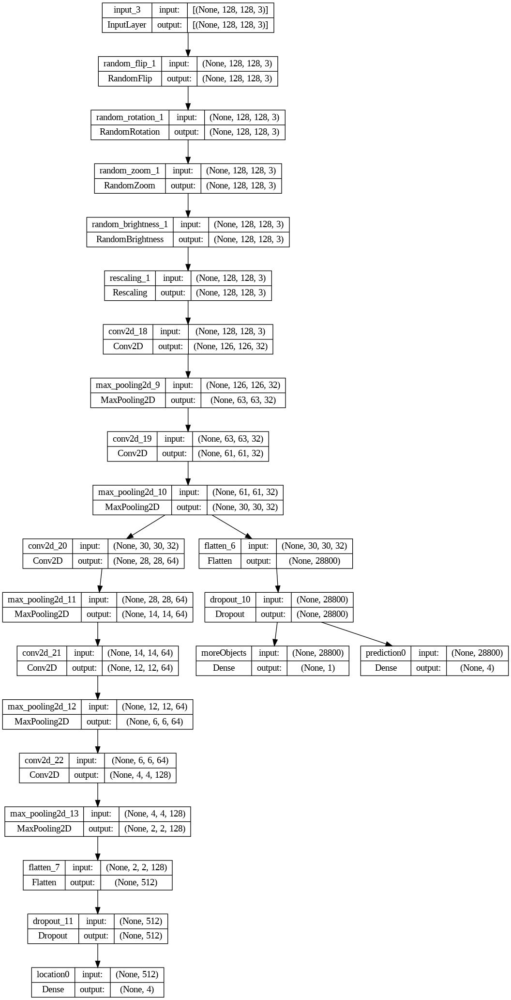

In [ ]:
from tensorflow.keras.utils import plot_model
imageLocation = "/content/drive/MyDrive/tf_workspace/"+modelFolderName+f"/{modelName}.jpg"
plot_model(model, show_shapes=True, to_file=imageLocation)

1/1 [==============================] - 0s 54ms/step


<ipython-input-23-24540e53e5a3>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 5, i+1)


NameError: ignored

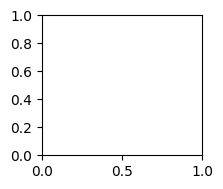

In [ ]:
import random
plt.figure(figsize=(12, 4))
for i in range(10):
    ax = plt.gca()
    plt.subplot(2, 5, i+1)
    imageNumber = random.randint(0, len(X_val))
    testVal = X_val[imageNumber]
    testVal = np.expand_dims(testVal, axis=0)
    predictions = model.predict(testVal)
    for index in range(0,maxImages):
      rect = patches.Rectangle((predictions[index*2+1][0][0]*targetSizeElement, predictions[index*2+1][0][1]*targetSizeElement), predictions[index*2+1][0][0]*targetSizeElement+predictions[index*2+1][0][2]*targetSizeElement, predictions[index*2+1][0][1]*targetSizeElement+predictions[index*2+1][0][3]*targetSizeElement, linewidth=1, edgecolor='r', facecolor='none')
      ax.add_patch(rect)
      print(predictions[index*2+2][0])
    print(testVal.shape)
    #plt.imshow(testVal)
plt.show()

In [ ]:
print(OverLength)

[83, 121, 123, 283, 310, 311, 322, 330, 351, 357, 376, 383, 385, 386, 387, 391, 392, 394, 395, 396, 397, 398, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 412, 414, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 449, 450, 451, 452, 453, 457, 458, 459, 460, 461, 462, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 485, 487, 569, 621, 675, 791, 993, 994]


1/1 [==============================] - 0s 28ms/step
Are there more objects False [[0.02825328]]
['\n   bee\n  ', '\n   insect\n  ', '\n   vespula\n  ', '\n   bumbleBee\n  ']
[37.36171  32.596916 50.24745  50.761074]
[0.49599034 0.6942269  0.11298475 0.46038717]
37.36171 32.596916 50.24745 50.761074


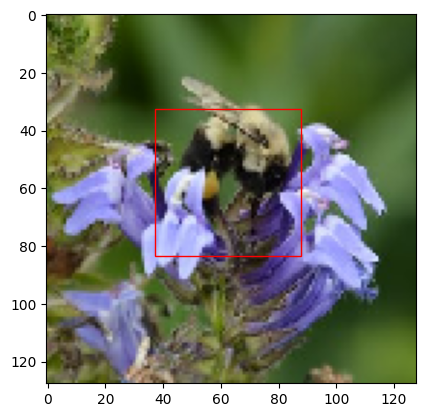

In [ ]:
import matplotlib.patches as patches
imageNumber = random.randint(0, len(X_val))
testVal = X_val[imageNumber]
testImage = testVal
testVal = np.expand_dims(testVal, axis=0)
predictions = model.predict(testVal)
plt.imshow(testImage)
ax = plt.gca()
print(f"Are there more objects {bool(int(predictions[0]))} {predictions[0]}")
print(Classlist)
for index in range(0,maxImages):
  #rect = patches.Rectangle((predictions[index*2+1][0][0]*targetSizeElement, predictions[index*2+1][0][1]*targetSizeElement), predictions[index*2+1][0][2]*targetSizeElement, predictions[index*2+1][0][3]*targetSizeElement, linewidth=1, edgecolor='r', facecolor='none')
  rect = patches.Rectangle((predictions[index*2+1][0][0], predictions[index*2+1][0][1]), predictions[index*2+1][0][2], predictions[index*2+1][0][3], linewidth=1, edgecolor='r', facecolor='none')
  ax.add_patch(rect)
  print(predictions[index*2+1][0])
  print(predictions[index*2+2][0])
  print(predictions[index*2+1][0][0], predictions[index*2+1][0][1], predictions[index*2+1][0][2], predictions[index*2+1][0][3])
  #print(predictions[index*2+1][0][0]*targetSizeElement, predictions[index*2+1][0][1]*targetSizeElement, predictions[index*2+1][0][2]*targetSizeElement, predictions[index*2+1][0][3]*targetSizeElement)
#rect = patches.Rectangle((predictions[2][0][0], predictions[2][0][1]), predictions[2][0][2], predictions[2][0][3], linewidth=1, edgecolor='r', facecolor='none')
# Add the patch to the Axes
#ax.add_patch(rect)
plt.show()

In [ ]:
modelLocation = "/content/drive/MyDrive/tf_workspace/"+modelFolderName
try:
  shutil.rmtree(modelLocation)
except FileNotFoundError:
  pass

In [ ]:
# Include the epoch in the file name (uses `str.format`)
checkpoint_path = "/content/drive/MyDrive/tf_workspace/"+modelFolderName+"/checkpoints/cp-{epoch:04d}.ckpt"
log_dir = "/content/drive/MyDrive/tf_workspace/"+modelFolderName+"/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logs_folder = f"/content/drive/MyDrive/tf_workspace/{modelFolderName}/logs"
checkpoint_dir = os.path.dirname(checkpoint_path)
# Create a callback that saves the model's weights every 5 epochs
cp_callback = [
    tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1),
]

if(CONTINUOUS_SAVE):
  cp_callback.append(
  tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    verbose=1,
    save_weights_only=True,
    save_freq=len(train_dataset)*STEPS_BETWEEN_SAVES),#*batch_size),
    )
else:
  cp_callback.append(
    tf.keras.callbacks.ModelCheckpoint(
      filepath=checkpoint_path,
      save_weights_only=True,
      monitor='val_accuracy',
      mode='max',
      save_best_only=True),
  )

if(EARLY_STOP):
  cp_callback.append(tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=200))
#model.trainable = False
# Save the weights using the `checkpoint_path` format
model.save_weights(checkpoint_path.format(epoch=0))
model.compile(optimizer='adam', metrics=["accuracy", 'mse'], loss='binary_crossentropy')

#Train Model

In [ ]:
with tf.device('/device:GPU:0'):
  startTime = time.time()
  model_fit = model.fit(train_dataset, epochs = training_epochs, callbacks=[cp_callback], validation_data=validation_dataset) #
  endTime = time.time()

In [ ]:
timeRequired = endTime-startTime
stringTime = time.strftime("%H:%M:%S", time.gmtime(timeRequired))
print(f"Required time for training is {stringTime} seconds")

Required time for training is 00:43:34 seconds


# Test Model

###Load Model

In [ ]:
#CALLBACK_PATH = "/content/drive/MyDrive/tf_workspace/CNN/Evaluate/Custom/checkpoints/cp-0035.ckpt"
#model.load_weights(CALLBACK_PATH).expect_partial()

In [ ]:
validation_dataset.class_indices

{'bee': 0, 'bumbee': 1, 'insect': 2, 'vespula': 3}

In [ ]:
from tensorflow.keras.preprocessing import image
from skimage import transform
validation_dataset.class_indices
dir_path = "/content/drive/MyDrive/tf_workspace/training_cnn/images/validation"
detWrong =[]
classes = 4
detWrongElement = []
for count in range(classes):
  detWrongElement.append([0,0,0,0,0])
for i in os.listdir(dir_path):
  for files in os.listdir(os.path.join(dir_path, i)):
    active_dir = os.path.join(dir_path, i)
    imagePath = os.path.join(active_dir, files)
    img = image.load_img(imagePath, target_size=(200,200))
    X = image.img_to_array(img)
    X = X.reshape(1, 200, 200, 3)
    #X = np.expand_dims(X,axis=0)
    #images = np.vstack([X])
    images = X.astype("float32")
    val = model.predict(images)
    detectionList = val.tolist()
    filename, _ = os.path.splitext(files)
    fileType = filename.split('(')
    fileTypeValue = None
    if(fileType[0] == "bee"):
      fileTypeValue = 0
    if(fileType[0] == "bumbeBee" or fileType[0] == "bumbleBee"):
      fileTypeValue = 1
    if(fileType[0] == "insect"):
      fileTypeValue = 2
    if(fileType[0] == "vespula"):
      fileTypeValue = 3
    if(fileTypeValue != None and detectionList[0][fileTypeValue] < 0.8):
      detWrong.append([detectionList[0],files])
      detWrongElement[fileTypeValue][0] +=1
      for index, element in enumerate(detectionList[0]):
        if(element >= 0.8):
          print(f"{filename} was identified as {index} with value {detectionList[0][fileTypeValue]}")
          print(detectionList)
          detWrongElement[fileTypeValue][index+1] +=1
    elif(fileTypeValue == None):
      print(filename)
print("bee, bumblebee, insect, vespula")
print(detWrongElement)

ValueError: ignored

In [ ]:
# Validation set evaluation
val_loss, val_accuracy = model.evaluate(testing_dataset,
                                        steps=int(val_size/bs)+1)
print('Accuracy: {}'.format(val_accuracy))

# Validation set predict

y_val = testing_dataset.classes

pred = model.predict(testing_dataset,
                     verbose=1
                     steps=int(val_size/bs)+1)

accuracy_TTA = np.mean(np.equal(y_val, np.argmax(pred, axis=-1)))
print('Accuracy: {}'.format(accuracy_TTA))

In [ ]:
y_val = testing_dataset.classes
pred = model.predict(testing_dataset)
accuracy_TTA = np.mean(np.equal(y_val, np.argmax(pred, axis=-1)))
print('Accuracy: {}'.format(accuracy_TTA))

31/31 [==============================] - 54s 2s/step
Accuracy: 0.6597510373443983


In [ ]:
print(model.evaluate(validation_dataset))

42/42 [==============================] - 290s 7s/step - loss: 0.1595 - accuracy: 0.8732 - mse: 0.0486
[0.15952423214912415, 0.8732075691223145, 0.04861427843570709]


In [ ]:
import pandas as pd
Y_pred = model.predict(validation_dataset)

 8/42 [====>.........................] - ETA: 2:00

KeyboardInterrupt: ignored

In [ ]:
y_pred = np.argmax(Y_pred, axis=1)
y_true = validation_dataset.classes
y_true = y_true[:len(y_pred)]
df = pd.DataFrame(data = {"y_true":y_true, "y_pred":y_pred, "Y_pred_class_0":[item[0] for item in Y_pred[:len(y_pred)]], "Y_pred_class_1":[item[1] for item in Y_pred[:len(y_pred)]], "filenames":validation_generator.filenames[:len(y_pred)]})

df["y_true2"] = df["filenames"].map(lambda x: x[0])
df["Result"] = np.where(df["y_true2"].astype('int32') == df["y_pred"].astype('int32'), 1, 0)
print('Accuracy with predict function - ',np.average(df["Result"]))

42/42 [==============================] - 106s 2s/step


NameError: ignored

In [ ]:
from PIL import Image
import numpy as np
from skimage import transform
def load(filename):
   np_image = Image.open(filename)
   np_image = np.array(np_image).astype('float32')/255
   np_image = transform.resize(np_image, (200, 200, 3))
   np_image = np.expand_dims(np_image, axis=0)
   return np_image

image = load('/content/drive/MyDrive/tf_workspace/training_cnn/images/validation/bee/bee(216).jpg')
print(model.predict(image))

1/1 [==============================] - 0s 28ms/step
[[2.7476443e-02 8.6136581e-08 2.0856466e-03 9.7043782e-01]]


In [ ]:
from tensorflow.keras.preprocessing import image
from PIL import Image
import numpy as np
from skimage import transform
def load(filename):
   np_image = Image.open(filename)
   np_image = np.array(np_image).astype('float32')/255
   np_image = transform.resize(np_image, (256, 256, 3))
   np_image = np.expand_dims(np_image, axis=0)
   return np_image
validation_dataset.class_indices
dir_path = "/content/drive/MyDrive/tf_workspace/training_cnn/images/validation"
detWrong =[]
classes = 4
detWrongAmount = 0
detRightAmount = 0
testedImages = 0
detWrongElement = []
for count in range(classes):
  detWrongElement.append([0,0,0,0,0])
for i in os.listdir(dir_path):
  for files in os.listdir(os.path.join(dir_path, i)):
    testedImages += 1
    active_dir = os.path.join(dir_path, i)
    imagePath = os.path.join(active_dir, files)
    images = load(imagePath)
    val = model.predict(images)
    detectionList = val.tolist()
    filename, _ = os.path.splitext(files)
    fileType = filename.split('(')
    fileTypeValue = None
    if(fileType[0] == "bee"):
      fileTypeValue = 0
    if(fileType[0] == "bumbeBee" or fileType[0] == "bumbleBee"or fileType[0] == "bumbee"):
      fileTypeValue = 1
    if(fileType[0] == "insect"):
      fileTypeValue = 2
    if(fileType[0] == "vespula"):
      fileTypeValue = 3
    if(fileTypeValue != None and detectionList[0][fileTypeValue] < 0.5):
      detWrongAmount += 1
      detWrong.append([detectionList[0],files])
      detWrongElement[fileTypeValue][0] +=1
      for index, element in enumerate(detectionList[0]):
        if(element >= 0.5):
          detWrongElement[fileTypeValue][index+1] +=1
    elif(fileTypeValue != None): detRightAmount += 1
    elif(fileTypeValue == None):
      print(filename)
print("bee, bumblebee, insect, vespula")
print(detWrongElement)
print(f"{testedImages} davon {detWrongAmount} falsch und {detRightAmount} richtig. Genauigkeit ist {detRightAmount / testedImages}")

1/1 [==============================] - 0s 75ms/step
bee, bumblebee, insect, vespula
[[184, 0, 4, 5, 159], [87, 4, 0, 3, 71], [438, 12, 4, 0, 414], [0, 0, 0, 0, 0]]
1325 davon 709 falsch und 616 richtig. Genauigkeit ist 0.4649056603773585


### Get number of files within the folder

In [ ]:
dirPath = "/content/drive/MyDrive/tf_workspace/training_cnn/images/validation"
os.listdir(dirPath)
for elements in os.listdir(dirPath):
  print(f"{elements}: {len(os.listdir(os.path.join(dirPath, elements)))}")

bee: 126
vespula: 32
insect: 237
bumbee: 91


# Load Model from Checkpoint

In [ ]:
# Loads the weights
cpt_path = "/content/drive/MyDrive/tf_workspace/CNN/Localisation/Custom_Detection_v1/checkpoints/cp-0050.ckpt"
model.load_weights(cpt_path)

# Re-evaluate the model
#print(model.evaluate(testing_dataset))
#print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('/content/drive/MyDrive/exported_models/CNN_Test_5000_Custom/model.tflite', 'wb+') as f:
  f.write(tflite_model)

In [ ]:
from tensorflow.keras.preprocessing import image
from PIL import Image
import numpy as np
from skimage import transform

def load(filename):
   np_image = Image.open(filename)
   np_image = np.array(np_image).astype('float32')/255
   np_image = transform.resize(np_image, (200, 200, 3))
   np_image = np.expand_dims(np_image, axis=0)
   return np_image

interpreter = tf.lite.Interpreter(model_path="/content/drive/MyDrive/exported_models/CNN_Test_5000_Custom/model.tflite")
imagePath = "/content/drive/MyDrive/tf_workspace/training_cnn/images/training/bee/bee(1004).jpg"

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
interpreter.allocate_tensors()

# lectura y procesamiento de image
new_img = images = load(imagePath)

# input_details[0]['index'] = the index which accepts the input
print(input_details[0])
print(new_img)
interpreter.set_tensor(tensor_index=input_details[0]['index'],value=[new_img])

# realizar la prediccion del interprete
interpreter.invoke()

# output_details[0]['index'] = the index which provides the input
output_data = interpreter.get_tensor(output_details[0]['index'])

print(output_data)

{'name': 'serving_default_conv2d_input:0', 'index': 0, 'shape': array([  1, 200, 200,   3], dtype=int32), 'shape_signature': array([ -1, 200, 200,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}
[[[[0.76817656 0.63852954 0.26108828]
   [0.7637547  0.6331174  0.2605587 ]
   [0.7553037  0.6225684  0.25961778]
   ...
   [0.7159212  0.5686961  0.09412665]
   [0.7205201  0.57598996 0.09925453]
   [0.7203822  0.5799511  0.09840209]]

  [[0.7697939  0.6431566  0.25863713]
   [0.76419675 0.63617736 0.25732398]
   [0.75379485 0.62317723 0.2556075 ]
   ...
   [0.72243303 0.56317693 0.08703258]
   [0.72493005 0.57269704 0.0964619 ]
   [0.7224416  0.5782252  0.09756826]]

  [[0.7676075  0.6369015  0.26195076]
   [0.76359916 0.63204074 0.26169685]
   [0.7558346  0.6223542  0.26102883]
   ...
   [0.71363    0.5706

ValueError: ignored

#TensorBoards

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
log_dir = logs_folder+"/fit/"

In [ ]:
tensorboard --logdir log_dir

Reusing TensorBoard on port 6006 (pid 26088), started 0:01:46 ago. (Use '!kill 26088' to kill it.)

<IPython.core.display.Javascript object>

## Show Model

In [ ]:
# Import the necessary libraries
from PIL import Image
from numpy import asarray, arange, mgrid, ndarray
from numpy.lib.stride_tricks import sliding_window_view
import math
def loadImage(path:str) ->Image:
    img = Image.open(path)
    img = img.convert('RGB')
    return img

def splitImage(image: Image, sectionSize=200, stepsPerSection = 1)->ndarray:
    steppLength = int(sectionSize / stepsPerSection)
    xSize = image.size[0] / sectionSize
    ySize = image.size[1] / sectionSize
    xSize = math.ceil(xSize)
    ySize = math.ceil(ySize)
    image = image.resize(size=(sectionSize*xSize, sectionSize*ySize))
    numpydata = asarray(image)
    imgShape = (sectionSize,sectionSize,3)
    result = sliding_window_view(numpydata, window_shape=imgShape)[::steppLength, ::steppLength]
    return result

#Example how to use
def exampleToSplitImage():
  img = loadImage("pixels2.png")

  result = splitImage(img, sectionSize=4, stepsPerSection=2)
  for x in result:
      for y in x:
          print(y[0])
          print(y[0].shape)
          pass
  print(result.shape)

In [ ]:
dot_img_file = f'/content/drive/MyDrive/Model_Img/{modelFolderName}.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
#maxImages
def getClassIndexList(value, classList: list)->list:
  returnList = [0] * len(classList)
  for index, element in enumerate(classList):
    if element == value:
      returnList[index] = 1
  return returnList
X = []
#Output = []
Y_train = []
Y_val = []

#Z = []
Classlist = []
imageCounter = 0
trainingFileDirList = os.listdir(training_img_dir)
random.shuffle(trainingFileDirList)
for files in trainingFileDirList:
  file_name, file_extension = os.path.splitext(files)
  if(file_extension == ".xml"):
    imageCounter += 1
    filePath = os.path.join(training_img_dir, files)
    with open(filePath, 'r') as f:
      data = f.read()
      Bs_data = BeautifulSoup(data, "xml")
      b_name = Bs_data.find('name')
      for items in Classlist:
        if(items == b_name.string):
          break
      else:
        Classlist.append(b_name.string)
trainImageCount = int(imageCounter * (1-0.2))
valImageCount = int(imageCounter * 0.2)
if(trainImageCount + valImageCount < imageCounter):
  diff = imageCounter - trainImageCount - valImageCount
  trainImageCount += diff
X_train = np.zeros((trainImageCount, targetSizeElement, targetSizeElement,3))
X_val = np.zeros((valImageCount, targetSizeElement, targetSizeElement,3))

Y_train.append(np.zeros((trainImageCount, 4)))
Y_val.append(np.zeros((valImageCount, 4)))

for count in range(maxImages):
  Y_train.append(np.zeros((trainImageCount, 4)))
  Y_train.append(np.zeros((trainImageCount, len(Classlist))))
for count in range(maxImages):
  Y_val.append(np.zeros((valImageCount, 4)))
  Y_val.append(np.zeros((valImageCount, len(Classlist))))
sectionCount = -1

for files in os.listdir(training_img_dir):
  file_name, file_extension = os.path.splitext(files)
  if(file_extension == ".xml"):
    sectionCount+= 1
    filePath = os.path.join(training_img_dir, files)
    with open(filePath, 'r') as f:
      data = f.read()
      Bs_data = BeautifulSoup(data, "xml")
      b_unique = Bs_data.find_all('object')
      if(True):
        for index, data in enumerate(b_unique):
          try:
            b_name = b_unique[index].find('name')
            if(b_name.string == "bumbebee" or b_name.string == "bumblebee")
              b_name.string = "bumbleBee"
      f.write(Bs_data.prettify())